## Решение хакатона для Утконоса

In [1]:
import pandas as pd
import glove
import numpy as np
import collections
import gensim.downloader as api
from gensim import corpora, models, similarities
from gensim.corpora import Dictionary
from tqdm import tqdm_notebook
from gensim.models import Word2Vec
import gensim
import math
import logging
import tensorflow as tf
import os
import time
from tensorflow.contrib.tensorboard.plugins import projector

from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
import numpy as np

from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import pairwise_distances
from scipy.cluster import hierarchy
import matplotlib.pyplot as plt


logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

/opt/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [26]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
import gensim
from gensim.models import Word2Vec
import logging
from tensorflow.contrib.tensorboard.plugins import projector

class IterableSentences():
    def __init__(self, sentences):
        self.sentences = sentences
        if '' in self.sentences:
            self.sentences.remove('')

    def __iter__(self):
        return ([str(x) for x in s] for s in self.sentences)
        #return (sorted(s.split('.0 ')[:-1]) for s in self.sentences)

def save_vectors_for_tb(model, log_dir):
    words = model.wv.index2word
    #print(words.shape)
    words_data = pd.DataFrame({'word': words, 'names' : result['PRODUCT_NAME'] })
    #'frequency': [model.wv.vocab[w].count for w in words],
    #words_data = pd.DataFrame({'word': result[cols].values, 'names' : result['PRODUCT_NAME'] })
    print(words_data.shape)
    words_data = words_data.dropna()
    print(words_data.shape)
    words_data.to_csv(os.path.join(log_dir, 'metadata.tsv'), sep='\t', index=None)

    tf.reset_default_graph()
    embeddings = tf.Variable(model.wv.vectors, name='embeddings')
    saver = tf.train.Saver()
    config = projector.ProjectorConfig()
    embedding = config.embeddings.add()
    embedding.tensor_name = embeddings.name
    embedding.metadata_path = 'metadata.tsv'
    summary_writer = tf.summary.FileWriter(log_dir)
    projector.visualize_embeddings(summary_writer, config)
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        saver.save(sess, os.path.join(log_dir, "words.ckpt"), 0)

In [2]:
items2 = pd.read_sas('items.sas7bdat', encoding = 'iso8859_5')

In [4]:
items2.head()

,SKU,SKU_NAME,Purchase_Group,Lev2_Id,Lev2_Name,Lev3_Id,Lev3_Name,SAP_IND,SAP_TYPE,SITE_IND,SITE_TYPE,CANCELED,Date,SALES_QTY,SALES_RUB
0,3071950.0,Конд/белья Lion Воздушный 720,Бытовая химия,004002,Стирка и уход за бельем,004002007,Средства для стирки,0.0,NaN,NaN,NaN,0.0,2015-02-06,5.0,1536.0
1,3184297.0,Филе Индолина инд.охл.700г шт,Охлажденное мясо,001019,"Мясо, птица",001019004,Мясо птицы охлажденное и замороженное,0.0,NaN,NaN,NaN,0.0,2015-01-31,35.0,10345.4
2,3186437.0,Яйцо Окское куриное С1 бел.дес,Яйцо,001009,Яйцо,001009005,Яйцо первой категории,1.0,Регулярное промо,NaN,NaN,0.0,2015-01-31,383.0,24129.0
3,3193219.0,Бедро Индолина инд.охл.Халяль 700г шт,Охлажденное мясо,001019,"Мясо, птица",001019004,Мясо птицы охлажденное и замороженное,0.0,NaN,NaN,NaN,0.0,2015-01-31,30.0,8523.9
4,3154351.0,Таблетки Claro д/ПММ 2020 25шт,Бытовая химия,004003,Уборка и уход за домом,004003006,Средства для уборки,0.0,NaN,NaN,NaN,0.0,2015-01-31,4.0,1938.3


In [3]:
feedstock_dict = pd.read_sas('feedstock_dict.sas7bdat')

In [4]:
sku_list = pd.read_sas('sku_list.sas7bdat')

In [5]:
orders = pd.read_sas('orders.sas7bdat')

In [6]:
checks = pd.read_sas('checks.sas7bdat')

In [7]:
cols1 = []
for c1 in checks.columns:
    if c1[:3] == 'Col':
        cols1.append(c1)
def f(X):
    return [x for x in X if np.isnan(x) == False]

In [8]:
%%time
words = [f(x) for x in checks[cols1].values.tolist()]

CPU times: user 16min 46s, sys: 30.7 s, total: 17min 17s
Wall time: 17min 16s


In [9]:
pd.DataFrame(words).to_pickle("checks_generator.pkl")

In [10]:
with open('checks_generator.pkl', 'rb') as f:
    words = pickle.load(f)

FileNotFoundError: [Errno 2] No such file or directory: 'checks_generator.pkl'

In [10]:
!ls

2_products.csv		 score6.sas7bdat
checks_generator.pkl	 score7_median.sas7bdat
checks.sas7bdat		 score7.sas7bdat
clusters.csv		 score8.sas7bdat
clusters.sas7bdat	 score_expanded.sas7bdat
compare_promo.sas7bdat	 score_short_test_2.sas7bdat
doli.csv		 score_short_test.sas7bdat
feedstock_dict.csv	 sku_list.sas7bdat
feedstock_dict.sas7bdat  storehouse_available.csv
frcst_joined.sas7bdat	 storehouse_available.sas7bdat
full.sas7bdat		 test_1cat.sas7bdat
items.csv		 test6.sas7bdat
items.sas7bdat		 test7_expand.sas7bdat
lags.sas7bdat		 test7_median.sas7bdat
margin_python.sas7bdat	 test7.sas7bdat
margin.sas7bdat		 test_expanded.sas7bdat
margins.csv		 test.sas7bdat
model2.bin		 tmp_table.sas7bdat
model3.bin		 tovary.csv
model4.bin		 train_1cat.sas7bdat
model.bin		 train6.sas7bdat
new_data		 train7_median.sas7bdat
orders.csv		 train7.sas7bdat
orders.sas7bdat		 train_expanded.sas7bdat
plots			 train_python.sas7bdat
prices.sas7bdat		 train.sas7bdat
promo.sas7bdat		 Untitled.ipynb
python			 utka3.egp

In [28]:
corp = IterableSentences(words)

In [29]:
model = Word2Vec(corp, min_count=25,window = 15, hs = 0, workers = 16, iter = 12)

2018-10-23 12:29:42,165 : INFO : collecting all words and their counts
2018-10-23 12:29:42,167 : INFO : PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2018-10-23 12:29:42,239 : INFO : PROGRESS: at sentence #10000, processed 31439 words, keeping 2665 word types
2018-10-23 12:29:42,311 : INFO : PROGRESS: at sentence #20000, processed 64358 words, keeping 3167 word types
2018-10-23 12:29:42,382 : INFO : PROGRESS: at sentence #30000, processed 95523 words, keeping 3392 word types
2018-10-23 12:29:42,459 : INFO : PROGRESS: at sentence #40000, processed 131031 words, keeping 3528 word types
2018-10-23 12:29:42,539 : INFO : PROGRESS: at sentence #50000, processed 165835 words, keeping 3619 word types
2018-10-23 12:29:42,613 : INFO : PROGRESS: at sentence #60000, processed 199210 words, keeping 3683 word types
2018-10-23 12:29:42,670 : INFO : PROGRESS: at sentence #70000, processed 234217 words, keeping 3724 word types
2018-10-23 12:29:42,720 : INFO : PROGRESS: at sentence #

2018-10-23 12:29:46,121 : INFO : PROGRESS: at sentence #730000, processed 2504140 words, keeping 4042 word types
2018-10-23 12:29:46,164 : INFO : PROGRESS: at sentence #740000, processed 2539019 words, keeping 4042 word types
2018-10-23 12:29:46,207 : INFO : PROGRESS: at sentence #750000, processed 2573160 words, keeping 4045 word types
2018-10-23 12:29:46,249 : INFO : PROGRESS: at sentence #760000, processed 2608624 words, keeping 4045 word types
2018-10-23 12:29:46,291 : INFO : PROGRESS: at sentence #770000, processed 2643462 words, keeping 4045 word types
2018-10-23 12:29:46,332 : INFO : PROGRESS: at sentence #780000, processed 2677963 words, keeping 4045 word types
2018-10-23 12:29:46,376 : INFO : PROGRESS: at sentence #790000, processed 2714410 words, keeping 4045 word types
2018-10-23 12:29:46,418 : INFO : PROGRESS: at sentence #800000, processed 2749773 words, keeping 4046 word types
2018-10-23 12:29:46,488 : INFO : PROGRESS: at sentence #810000, processed 2787189 words, keeping

2018-10-23 12:29:49,972 : INFO : PROGRESS: at sentence #1460000, processed 5070598 words, keeping 4058 word types
2018-10-23 12:29:50,013 : INFO : PROGRESS: at sentence #1470000, processed 5106381 words, keeping 4058 word types
2018-10-23 12:29:50,056 : INFO : PROGRESS: at sentence #1480000, processed 5142012 words, keeping 4058 word types
2018-10-23 12:29:50,097 : INFO : PROGRESS: at sentence #1490000, processed 5177667 words, keeping 4058 word types
2018-10-23 12:29:50,139 : INFO : PROGRESS: at sentence #1500000, processed 5212619 words, keeping 4058 word types
2018-10-23 12:29:50,180 : INFO : PROGRESS: at sentence #1510000, processed 5248382 words, keeping 4058 word types
2018-10-23 12:29:50,221 : INFO : PROGRESS: at sentence #1520000, processed 5282538 words, keeping 4058 word types
2018-10-23 12:29:50,261 : INFO : PROGRESS: at sentence #1530000, processed 5315979 words, keeping 4058 word types
2018-10-23 12:29:50,301 : INFO : PROGRESS: at sentence #1540000, processed 5348759 words

2018-10-23 12:29:52,947 : INFO : PROGRESS: at sentence #2180000, processed 7535316 words, keeping 4068 word types
2018-10-23 12:29:53,021 : INFO : PROGRESS: at sentence #2190000, processed 7568565 words, keeping 4068 word types
2018-10-23 12:29:53,095 : INFO : PROGRESS: at sentence #2200000, processed 7601134 words, keeping 4068 word types
2018-10-23 12:29:53,171 : INFO : PROGRESS: at sentence #2210000, processed 7633245 words, keeping 4068 word types
2018-10-23 12:29:53,248 : INFO : PROGRESS: at sentence #2220000, processed 7666328 words, keeping 4068 word types
2018-10-23 12:29:53,329 : INFO : PROGRESS: at sentence #2230000, processed 7698288 words, keeping 4068 word types
2018-10-23 12:29:53,407 : INFO : PROGRESS: at sentence #2240000, processed 7732469 words, keeping 4068 word types
2018-10-23 12:29:53,485 : INFO : PROGRESS: at sentence #2250000, processed 7765968 words, keeping 4068 word types
2018-10-23 12:29:53,560 : INFO : PROGRESS: at sentence #2260000, processed 7798030 words

2018-10-23 12:29:57,266 : INFO : PROGRESS: at sentence #2900000, processed 9922631 words, keeping 4069 word types
2018-10-23 12:29:57,343 : INFO : PROGRESS: at sentence #2910000, processed 9956829 words, keeping 4069 word types
2018-10-23 12:29:57,420 : INFO : PROGRESS: at sentence #2920000, processed 9990973 words, keeping 4069 word types
2018-10-23 12:29:57,497 : INFO : PROGRESS: at sentence #2930000, processed 10024989 words, keeping 4069 word types
2018-10-23 12:29:57,575 : INFO : PROGRESS: at sentence #2940000, processed 10059030 words, keeping 4069 word types
2018-10-23 12:29:57,642 : INFO : PROGRESS: at sentence #2950000, processed 10092120 words, keeping 4069 word types
2018-10-23 12:29:57,694 : INFO : PROGRESS: at sentence #2960000, processed 10127294 words, keeping 4069 word types
2018-10-23 12:29:57,734 : INFO : collected 4075 word types from a corpus of 10156260 raw words and 2967490 sentences
2018-10-23 12:29:57,735 : INFO : Loading a fresh vocabulary
2018-10-23 12:29:57,7

2018-10-23 12:30:57,408 : INFO : EPOCH 2 - PROGRESS: at 53.78% examples, 231086 words/s, in_qsize 32, out_qsize 0
2018-10-23 12:30:58,505 : INFO : EPOCH 2 - PROGRESS: at 58.25% examples, 237762 words/s, in_qsize 26, out_qsize 1
2018-10-23 12:30:59,525 : INFO : EPOCH 2 - PROGRESS: at 61.21% examples, 238916 words/s, in_qsize 27, out_qsize 0
2018-10-23 12:31:02,797 : INFO : EPOCH 2 - PROGRESS: at 62.77% examples, 214498 words/s, in_qsize 32, out_qsize 1
2018-10-23 12:31:03,804 : INFO : EPOCH 2 - PROGRESS: at 66.57% examples, 218665 words/s, in_qsize 30, out_qsize 0
2018-10-23 12:31:04,841 : INFO : EPOCH 2 - PROGRESS: at 70.01% examples, 221155 words/s, in_qsize 30, out_qsize 1
2018-10-23 12:31:05,868 : INFO : EPOCH 2 - PROGRESS: at 73.90% examples, 224989 words/s, in_qsize 31, out_qsize 0
2018-10-23 12:31:06,905 : INFO : EPOCH 2 - PROGRESS: at 77.82% examples, 228135 words/s, in_qsize 31, out_qsize 1
2018-10-23 12:31:07,969 : INFO : EPOCH 2 - PROGRESS: at 81.78% examples, 231125 words/s,

2018-10-23 12:31:56,695 : INFO : EPOCH 4 - PROGRESS: at 8.92% examples, 138762 words/s, in_qsize 0, out_qsize 3
2018-10-23 12:31:57,721 : INFO : EPOCH 4 - PROGRESS: at 12.16% examples, 159374 words/s, in_qsize 9, out_qsize 0
2018-10-23 12:31:58,730 : INFO : EPOCH 4 - PROGRESS: at 14.90% examples, 170189 words/s, in_qsize 19, out_qsize 0
2018-10-23 12:31:59,751 : INFO : EPOCH 4 - PROGRESS: at 17.79% examples, 180219 words/s, in_qsize 28, out_qsize 0
2018-10-23 12:32:00,765 : INFO : EPOCH 4 - PROGRESS: at 21.55% examples, 196544 words/s, in_qsize 29, out_qsize 2
2018-10-23 12:32:01,766 : INFO : EPOCH 4 - PROGRESS: at 25.90% examples, 214962 words/s, in_qsize 32, out_qsize 0
2018-10-23 12:32:02,784 : INFO : EPOCH 4 - PROGRESS: at 29.80% examples, 226859 words/s, in_qsize 32, out_qsize 0
2018-10-23 12:32:03,789 : INFO : EPOCH 4 - PROGRESS: at 32.70% examples, 229487 words/s, in_qsize 32, out_qsize 0
2018-10-23 12:32:07,253 : INFO : EPOCH 4 - PROGRESS: at 33.39% examples, 184199 words/s, in

2018-10-23 12:33:07,229 : INFO : worker thread finished; awaiting finish of 10 more threads
2018-10-23 12:33:07,242 : INFO : worker thread finished; awaiting finish of 9 more threads
2018-10-23 12:33:07,244 : INFO : worker thread finished; awaiting finish of 8 more threads
2018-10-23 12:33:07,248 : INFO : worker thread finished; awaiting finish of 7 more threads
2018-10-23 12:33:07,263 : INFO : worker thread finished; awaiting finish of 6 more threads
2018-10-23 12:33:07,268 : INFO : worker thread finished; awaiting finish of 5 more threads
2018-10-23 12:33:07,273 : INFO : worker thread finished; awaiting finish of 4 more threads
2018-10-23 12:33:07,283 : INFO : worker thread finished; awaiting finish of 3 more threads
2018-10-23 12:33:07,292 : INFO : worker thread finished; awaiting finish of 2 more threads
2018-10-23 12:33:07,293 : INFO : worker thread finished; awaiting finish of 1 more threads
2018-10-23 12:33:07,294 : INFO : worker thread finished; awaiting finish of 0 more thread

2018-10-23 12:34:09,578 : INFO : EPOCH 7 - PROGRESS: at 56.88% examples, 221529 words/s, in_qsize 31, out_qsize 1
2018-10-23 12:34:10,584 : INFO : EPOCH 7 - PROGRESS: at 60.36% examples, 225279 words/s, in_qsize 29, out_qsize 1
2018-10-23 12:34:11,618 : INFO : EPOCH 7 - PROGRESS: at 63.88% examples, 228430 words/s, in_qsize 32, out_qsize 0
2018-10-23 12:34:12,646 : INFO : EPOCH 7 - PROGRESS: at 67.91% examples, 232757 words/s, in_qsize 29, out_qsize 0
2018-10-23 12:34:13,653 : INFO : EPOCH 7 - PROGRESS: at 71.12% examples, 234438 words/s, in_qsize 32, out_qsize 0
2018-10-23 12:34:16,932 : INFO : EPOCH 7 - PROGRESS: at 73.28% examples, 215492 words/s, in_qsize 32, out_qsize 0
2018-10-23 12:34:17,954 : INFO : EPOCH 7 - PROGRESS: at 77.80% examples, 220578 words/s, in_qsize 31, out_qsize 0
2018-10-23 12:34:18,977 : INFO : EPOCH 7 - PROGRESS: at 82.39% examples, 225610 words/s, in_qsize 23, out_qsize 1
2018-10-23 12:34:19,991 : INFO : EPOCH 7 - PROGRESS: at 86.14% examples, 228318 words/s,

2018-10-23 12:35:11,115 : INFO : EPOCH 9 - PROGRESS: at 16.06% examples, 166080 words/s, in_qsize 21, out_qsize 1
2018-10-23 12:35:12,153 : INFO : EPOCH 9 - PROGRESS: at 20.04% examples, 185523 words/s, in_qsize 32, out_qsize 0
2018-10-23 12:35:13,177 : INFO : EPOCH 9 - PROGRESS: at 23.18% examples, 194983 words/s, in_qsize 26, out_qsize 6
2018-10-23 12:35:14,235 : INFO : EPOCH 9 - PROGRESS: at 27.51% examples, 211124 words/s, in_qsize 30, out_qsize 1
2018-10-23 12:35:15,247 : INFO : EPOCH 9 - PROGRESS: at 31.53% examples, 223208 words/s, in_qsize 30, out_qsize 1
2018-10-23 12:35:16,261 : INFO : EPOCH 9 - PROGRESS: at 34.86% examples, 228389 words/s, in_qsize 26, out_qsize 5
2018-10-23 12:35:17,269 : INFO : EPOCH 9 - PROGRESS: at 38.81% examples, 237130 words/s, in_qsize 26, out_qsize 0
2018-10-23 12:35:18,272 : INFO : EPOCH 9 - PROGRESS: at 41.82% examples, 239227 words/s, in_qsize 31, out_qsize 2
2018-10-23 12:35:22,510 : INFO : EPOCH 9 - PROGRESS: at 44.75% examples, 201401 words/s,

2018-10-23 12:36:24,163 : INFO : worker thread finished; awaiting finish of 9 more threads
2018-10-23 12:36:24,164 : INFO : worker thread finished; awaiting finish of 8 more threads
2018-10-23 12:36:24,165 : INFO : worker thread finished; awaiting finish of 7 more threads
2018-10-23 12:36:24,165 : INFO : worker thread finished; awaiting finish of 6 more threads
2018-10-23 12:36:24,166 : INFO : worker thread finished; awaiting finish of 5 more threads
2018-10-23 12:36:24,171 : INFO : worker thread finished; awaiting finish of 4 more threads
2018-10-23 12:36:24,172 : INFO : worker thread finished; awaiting finish of 3 more threads
2018-10-23 12:36:24,176 : INFO : worker thread finished; awaiting finish of 2 more threads
2018-10-23 12:36:24,182 : INFO : worker thread finished; awaiting finish of 1 more threads
2018-10-23 12:36:24,184 : INFO : worker thread finished; awaiting finish of 0 more threads
2018-10-23 12:36:24,185 : INFO : EPOCH - 10 : training on 10156260 raw words (8834884 effe

2018-10-23 12:37:33,825 : INFO : EPOCH 12 - PROGRESS: at 63.99% examples, 191476 words/s, in_qsize 31, out_qsize 1
2018-10-23 12:37:34,833 : INFO : EPOCH 12 - PROGRESS: at 68.21% examples, 197045 words/s, in_qsize 32, out_qsize 0
2018-10-23 12:37:35,833 : INFO : EPOCH 12 - PROGRESS: at 72.16% examples, 201829 words/s, in_qsize 27, out_qsize 0
2018-10-23 12:37:36,850 : INFO : EPOCH 12 - PROGRESS: at 76.06% examples, 205581 words/s, in_qsize 26, out_qsize 0
2018-10-23 12:37:37,854 : INFO : EPOCH 12 - PROGRESS: at 79.24% examples, 207383 words/s, in_qsize 32, out_qsize 0
2018-10-23 12:37:41,398 : INFO : EPOCH 12 - PROGRESS: at 82.40% examples, 194980 words/s, in_qsize 31, out_qsize 0
2018-10-23 12:37:42,430 : INFO : EPOCH 12 - PROGRESS: at 87.34% examples, 200708 words/s, in_qsize 32, out_qsize 0
2018-10-23 12:37:43,453 : INFO : EPOCH 12 - PROGRESS: at 91.89% examples, 205060 words/s, in_qsize 28, out_qsize 1
2018-10-23 12:37:44,459 : INFO : EPOCH 12 - PROGRESS: at 95.12% examples, 206717

In [30]:
df = pd.DataFrame(model.wv.vectors)
df['word'] = model.wv.index2word

In [31]:
prod = pd.DataFrame()
prod['word2'] = items2['SKU'].apply(lambda x: str(x))
df['word2'] = df['word'].apply(lambda x: str(x))
prod['PRODUCT_NAME'] = items2['SKU_NAME']
#prod['group']= items2['Группа Закупок']
prod = prod.drop_duplicates()

In [32]:
result = pd.merge(df, prod[['word2','PRODUCT_NAME']], how = 'left', on = 'word2').fillna('unknown')

In [27]:
#result = pd.read_csv('word2vec_result2.csv')

In [33]:
save_vectors_for_tb(model, '/opt/OpenSourceProjects/tb_test')

(3854, 2)
(3854, 2)


In [51]:
#prod['word'] = prod['PRODUCT_ID'].apply(lambda x: str(x)[:-2])
def most_similar_word(word):
    print(prod[prod.word2 == word]['PRODUCT_NAME'])
    print('******************************************************')
    print(pd.merge(pd.DataFrame(model.wv.most_similar(positive=[word]), columns =['word2','probability']), prod,
                    how ='inner', on ='word2')[['word2','probability','PRODUCT_NAME']])
    #return model.wv.most_similar(positive=[word])[0][1]

In [77]:
result[130:160]

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,word,word2,PRODUCT_NAME,cluster
130,-0.633946,0.301168,-2.703612,-0.728238,-0.337508,1.362650,1.352501,-2.436649,1.141604,0.128336,...,-2.505503,-0.716951,-1.527216,-0.239754,1.214811,0.795199,3108510.0,3108510.0,Конд/белья Frosch Миндальное мол.750мл,5
131,-1.113529,0.975008,-0.698248,-1.656180,-1.248154,-0.106481,1.101283,0.936845,-0.020696,1.088371,...,-0.456461,1.099101,-0.694492,1.149081,0.883789,-0.061562,3267743.0,3267743.0,Порош.чистящ.Пемолюкс Лимон Сода 5 480г,9
132,0.320119,-0.870335,-1.768623,-2.577525,-1.006270,0.866149,0.753431,-0.706612,0.842417,1.623260,...,-0.766357,2.761615,-1.481072,1.937166,0.630301,0.213700,3202331.0,3202331.0,Крем чист.Cif Ultra White отбел.эфф500мл,7
133,0.981838,-0.178601,-0.743208,1.181642,0.062616,-1.438765,-1.400195,0.226235,0.144924,-0.749755,...,1.124360,-0.516618,1.073354,-0.770184,2.011503,0.417332,4007130.0,4007130.0,Цыпленок Кур.царство бр.1 сорт охл.1кг,10
134,2.324090,-0.921680,0.702572,1.509264,1.002595,-0.819645,0.296988,-1.450127,0.304497,1.432635,...,1.108315,-1.904425,-0.379468,-0.259866,1.408299,0.598805,3184297.0,3184297.0,Филе Индолина инд.охл.700г шт,11
135,1.323288,0.383047,-0.208229,0.596508,-0.752838,0.100400,-1.580267,-0.341116,-1.507510,3.556296,...,1.878287,-1.801105,-3.195993,0.620683,0.054903,-0.400770,3053609.0,3053609.0,"Ср-во д/пос.Fairy Ромашка/витамин Е 0,5л",6
136,0.608093,-0.774435,0.071656,2.072672,0.807366,-2.649557,-2.434628,-0.182845,0.978375,-0.035635,...,0.986580,-1.205660,1.108263,-1.076230,1.198889,1.321280,4009189.0,4009189.0,Суповой набор Эколь гов.охл.ГЗС 1кг,10
137,0.655329,0.121152,-0.897789,-0.739413,-3.031132,0.257615,1.349550,-0.401886,0.022685,0.307522,...,2.326271,1.245855,2.697180,-0.175384,-1.780907,-0.086190,3221408.0,3221408.0,"Гель д/стир.Ушастый нянь дет.белья 1,2л",11
138,1.977428,-0.110049,-0.715947,2.119899,-1.450328,0.797876,-1.725953,-1.631104,-1.530746,2.848952,...,3.388700,1.235305,-1.973197,-1.259057,2.162410,0.978209,3243294.0,3243294.0,Яйцо куриное Лето деревенское С1 30шт,11
139,0.366392,-1.615817,-0.174113,-2.282204,0.054570,2.260477,0.919177,0.000936,0.076719,1.326395,...,0.352656,-0.009203,-2.290340,2.745299,-3.030037,-3.289078,3054392.0,3054392.0,Ср-во Comet д/ванной ком.спрей 500мл,7


In [88]:
# пример нахождения похожих товаров с точки зрения покупателя
most_similar_word('4007993.0')

148021    Набор Петелинка д/пер.блюд 1кг
Name: PRODUCT_NAME, dtype: object
******************************************************
       word2  probability                             PRODUCT_NAME
0  4007152.0     0.830036   Набор Куриное царство д/пер.бл.охл.1кг
1  4007988.0     0.747962       Окорочок Петелинка Особый ц/бр.1кг
2  4007984.0     0.718648        Бедро Петелинка Особое ц/бр.1кг 1
3  4007959.0     0.710343       Цыплёнок Петелинка  бройл.подл.1кг
4  4010135.0     0.700189         Фарш Кур.царство куриный зам.1кг
5  4007977.0     0.695349           Грудка Петелинка ц/бр.с кож1кг
6  4007987.0     0.689190                 Крыло Петелинка ц/бр.1кг
7  4009189.0     0.682085      Суповой набор Эколь гов.охл.ГЗС 1кг
8  4007992.0     0.668400  Окорочок Петелинка ц/бр.с кожей охл.1кг
9  3229152.0     0.667306  Фарш Останкино Любительский охл.500г шт


/opt/anaconda3/lib/python3.6/site-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


In [76]:
df['probability'] = df.word.apply(lambda x: most_similar_word(x))

/opt/anaconda3/lib/python3.6/site-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


In [80]:
df['probability'].min()

0.4102739691734314

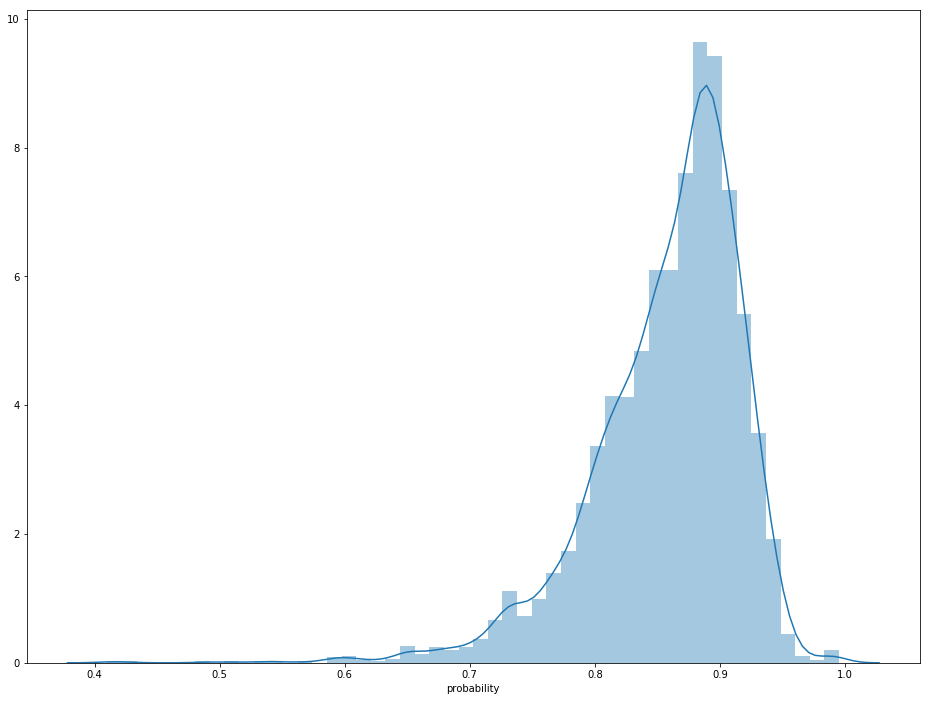

In [82]:
#Гистограмма распределения ближайших похожих товаров
import seaborn as sns
plt.figure(figsize = (16,12))
sns.distplot(df['probability'])

In [247]:
test = pd.merge(df[df['probability'] < 0.75], prod, how ='inner', on ='word2')[['word2','PRODUCT_NAME','probability']]
test['SKU'] = test['word2']

In [14]:
#pp = pd.read_csv('2_products.csv',encoding = 'utf-8',sep=';')
pp = pd.read_csv('margins.csv',encoding = 'utf-8',sep=';')

In [89]:
p0 = pp[pp.cluster == 62]

In [90]:
from datetime import datetime
p0['Date0'] = p0['Date'].apply(lambda x:datetime.strptime(x, '%d.%m.%Y'))
p0['sum_qnt'] = p0['sum_qnt'].apply(lambda x: float(x.replace(',','.')))
p0['reg_qnt'] = p0['reg_qnt'].apply(lambda x: float(x.replace(',','.')))
p0['promo_qnt'] = p0['promo_qnt'].apply(lambda x: float(x.replace(',','.')))
#p0['sum_qnt'] = p0.SALES_QTY

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

Text(0,0.5,'Прибыль')

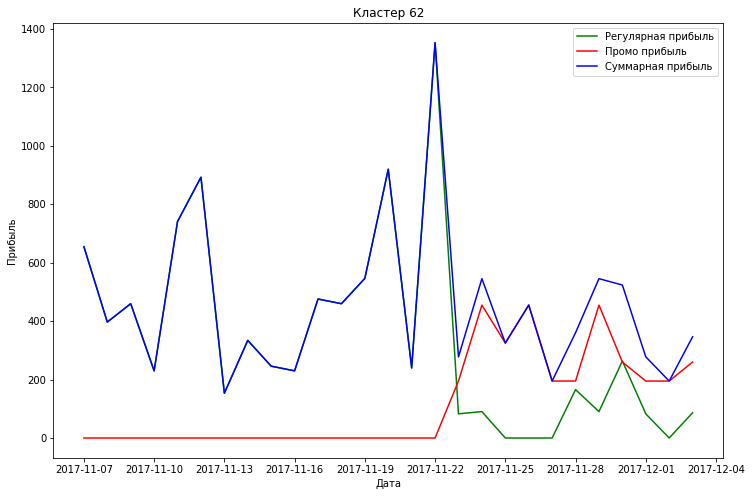

In [91]:
plt.figure(figsize=(12,8))
plt.plot(p0['Date0'][1:], p0['reg_qnt'][1:], label = 'Регулярная прибыль', color = 'g')
plt.plot(p0['Date0'][1:], p0['promo_qnt'][1:], label = 'Промо прибыль', color = 'r')
plt.plot(p0['Date0'][1:], p0['sum_qnt'][1:], label = 'Суммарная прибыль', color = 'b')
plt.legend()
plt.title('Кластер 62')
plt.xlabel('Дата')
plt.ylabel('Прибыль')

In [92]:
p0 = pp[pp.cluster == 63]

In [93]:
from datetime import datetime
p0['Date0'] = p0['Date'].apply(lambda x:datetime.strptime(x, '%d.%m.%Y'))
p0['sum_qnt'] = p0['sum_qnt'].apply(lambda x: float(x.replace(',','.')))
p0['reg_qnt'] = p0['reg_qnt'].apply(lambda x: float(x.replace(',','.')))
p0['promo_qnt'] = p0['promo_qnt'].apply(lambda x: float(x.replace(',','.')))
#p0['sum_qnt'] = p0.SALES_QTY

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

Text(0,0.5,'Прибыль')

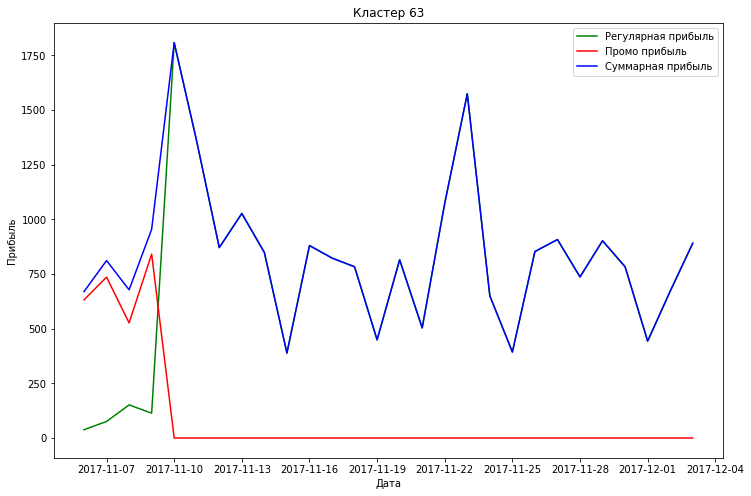

In [95]:
plt.figure(figsize=(12,8))
plt.plot(p0['Date0'], p0['reg_qnt'], label = 'Регулярная прибыль', color = 'g')
plt.plot(p0['Date0'], p0['promo_qnt'], label = 'Промо прибыль', color = 'r')
plt.plot(p0['Date0'], p0['sum_qnt'], label = 'Суммарная прибыль', color = 'b')
plt.legend()
plt.title('Кластер 63')
plt.xlabel('Дата')
plt.ylabel('Прибыль')

In [120]:
items['word2'] = items['SKU'].apply(lambda x: str(x))

In [134]:
items2 = pd.read_sas('train_python.sas7bdat', encoding = 'iso8859_5')

In [136]:
items2['word2'] = items2['SKU'].apply(lambda x: str(x))

In [137]:
items2.head()

,SKU,Date,SKU_NAME,Purchase_Group,Price,SALES_QTY,SALES_RUB,word2
0,2010387.0,2015-01-03,"Рулька Велком свиная охл.в/у 1,8кг",Охлажденное мясо,209.230522,6.212,1299.74,2010387.0
1,2011278.0,2015-01-03,"Тушка Утолина утенка потр.охл.1,5-2кг",Охлажденное мясо,224.961024,3.592,808.06,2011278.0
2,4006955.0,2015-01-03,Вырезка Велком свиная охл.в/у 1кг,Охлажденное мясо,504.839798,2.372,1197.48,4006955.0
3,4006964.0,2015-01-03,Рулька Велком свиная охл.в/у 1кг,Охлажденное мясо,209.231754,3.124,653.64,4006964.0
4,4006973.0,2015-01-03,Корейка Велком свиная охл.в/у 1кг,Охлажденное мясо,511.617900,2.324,1189.00,4006973.0


In [183]:
test2 = pd.merge(a, items2 ,how = 'inner', on = 'word2')[['word2','PRODUCT_NAME','Date', 'SALES_QTY','SALES_RUB','Price']]

In [123]:
test2['price'] = test2.SALES_RUB/ test2.SALES_QTY

In [192]:
test2['price'] = test2['Price'].apply(lambda x :int(x) if np.isnan(x) != True else x)
test2['word'] = test2.word2

In [34]:
cols = result.columns[:100]

In [97]:
# кластеризация
from sklearn.manifold import TSNE

In [36]:
%%time
X_embedded = TSNE(n_components=3, n_iter = 1000).fit_transform(result[cols])

CPU times: user 3min 45s, sys: 40.7 s, total: 4min 26s
Wall time: 4min 25s


In [36]:
?hierarchy.linkage

In [79]:
%%time
Z_full = hierarchy.linkage(result[cols],method='ward')
#Z_full = hierarchy.linkage(X_embedded,method='ward')

CPU times: user 1.38 s, sys: 15.8 ms, total: 1.4 s
Wall time: 1.4 s


In [82]:
cl2 = hierarchy.fcluster(Z_full, 100, criterion='distance', R=None, monocrit=None)

In [83]:
len(set(cl2))

13

In [84]:
result['cluster'] = cl2

In [32]:
result[['word2','cluster']].to_csv('clusters.csv',index = False)

HBox(children=(IntProgress(value=0, max=11), HTML(value='')))

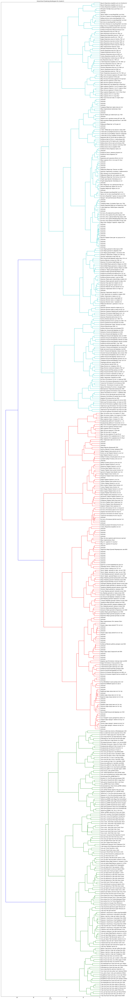

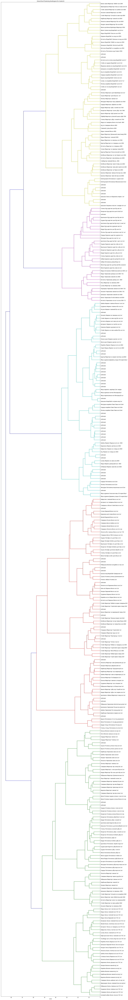

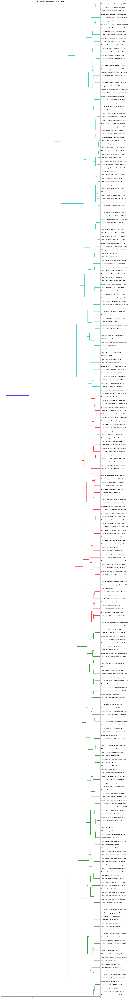

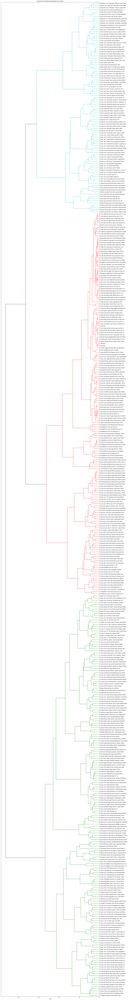

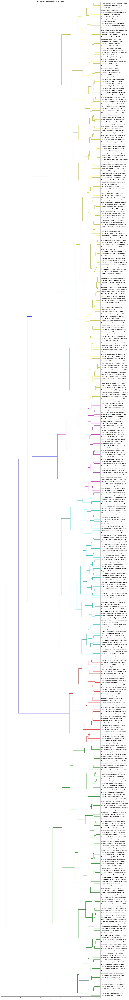

...

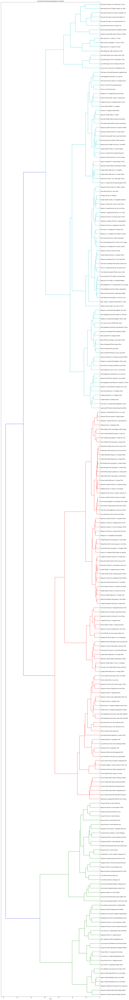

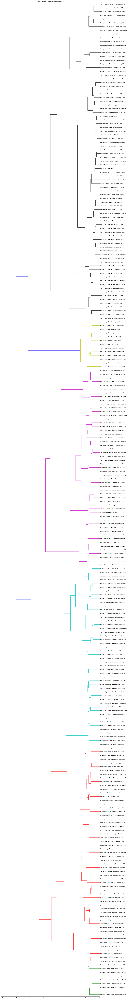

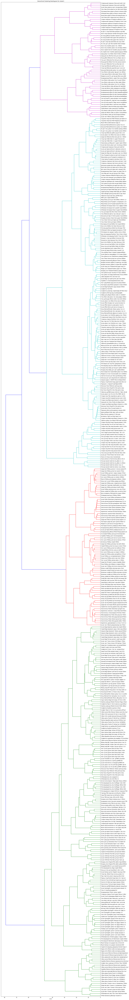

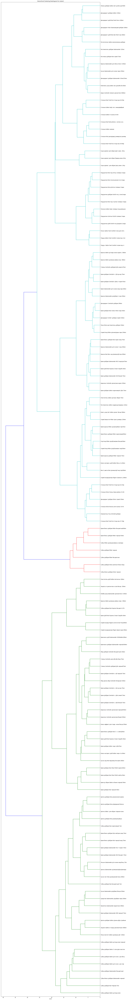

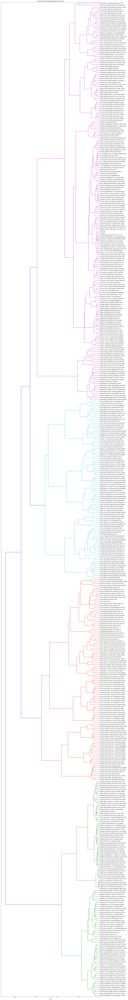

In [50]:
for el in tqdm_notebook(result.cluster.unique()):
    Z = hierarchy.linkage(result[result.cluster == el][cols], 'ward')
    fig=plt.figure(figsize=(20, 200))
    ax = fig.add_axes([0.1,0.1,0.75,0.75])
    ax.set_title("Hierarchical Clustering Dendrogram for cluster" + str(el))
    ax.set_xlabel("distance")
    ax.set_xlabel("name")
    hierarchy.dendrogram(Z, orientation='left',leaf_rotation=0., leaf_font_size=12.,labels=result[result.cluster == el].PRODUCT_NAME.values)
    ax.yaxis.set_label_position('left')
    ax.yaxis.tick_right()
    plt.savefig('tree_for_cluster_'+ str(el) +'.png', dpi=320, format='png', bbox_inches='tight')

In [59]:
cl = hierarchy.fcluster(Z, 3, criterion='distance', R=None, monocrit=None)

In [102]:
df_cl['cluster2'] = cl2

In [64]:
df_cl['pn'] = result['PRODUCT_NAME']

In [54]:
a = df['word'][2]

In [55]:
model.most_similar(positive=[a])

/opt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/opt/anaconda3/lib/python3.6/site-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('3243285.0', 0.7223095893859863),
 ('3186418.0', 0.6686335802078247),
 ('3303025.0', 0.6514841914176941),
 ('3229152.0', 0.6406714916229248),
 ('3186437.0', 0.6345043182373047),
 ('3051823.0', 0.6101531982421875),
 ('3259484.0', 0.6037434339523315),
 ('3285565.0', 0.5927168130874634),
 ('3319498.0', 0.5662137866020203),
 ('3286410.0', 0.5654202699661255)]

In [ ]:
def most_similar_word(word):
    print(prod[products.PROD_ID == word]['PRODUCT_NAME'])
    print('******************************************************')
    print(pd.merge(pd.DataFrame(model_w2v_v2.wv.most_similar(positive=[word]), columns =['word','probability']),
                    products, how ='inner', on ='word')[['word','probability','PRODUCT_NAME']])

In [137]:
clustres_dbscan = DBSCAN(eps = 1, min_samples=2).fit_predict(X_embedded)

In [139]:
len(set(clustres_dbscan))

750

In [197]:
df_cl['cluster_d'] = clustres_dbscan

In [210]:
result['cluster_dbscan'] = clustres_dbscan

In [202]:
df_cl['SKU_ID'] = prod.word2

In [211]:
result.to_csv('clusters.csv')